In [1]:
import sys
sys.path.append('..')

from EBC import EBC

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import mdtraj as md
import seaborn as sns
import scipy.sparse as snp

from rdkit import Chem
from rdkit.Chem import AllChem

In [3]:
N = 10000
SYSTEM_NAME = 'ALAD'
FOLDER = '/home/moritzt/Workspace/Clustering/examples/data/'

In [4]:
trajectory = md.load(f'{FOLDER}{SYSTEM_NAME}_trajectory.dcd', top=f'{FOLDER}{SYSTEM_NAME}_init.pdb')
trajectory = trajectory.superpose(trajectory[0])
phi, psi = md.compute_phi(trajectory)[1], md.compute_psi(trajectory)[1]
torsions = np.concatenate((phi, psi), axis=-1) + np.pi
energies = np.genfromtxt(f'{FOLDER}{SYSTEM_NAME}_trajectory.csv', delimiter='\t', usecols=[2])
torsions_rdkit = np.load(f'{FOLDER}{SYSTEM_NAME}_torsions_rdkit.npy') + np.pi
energies_rdkit = np.load(f'{FOLDER}{SYSTEM_NAME}_energies_rdkit.npy')

<AxesSubplot:>

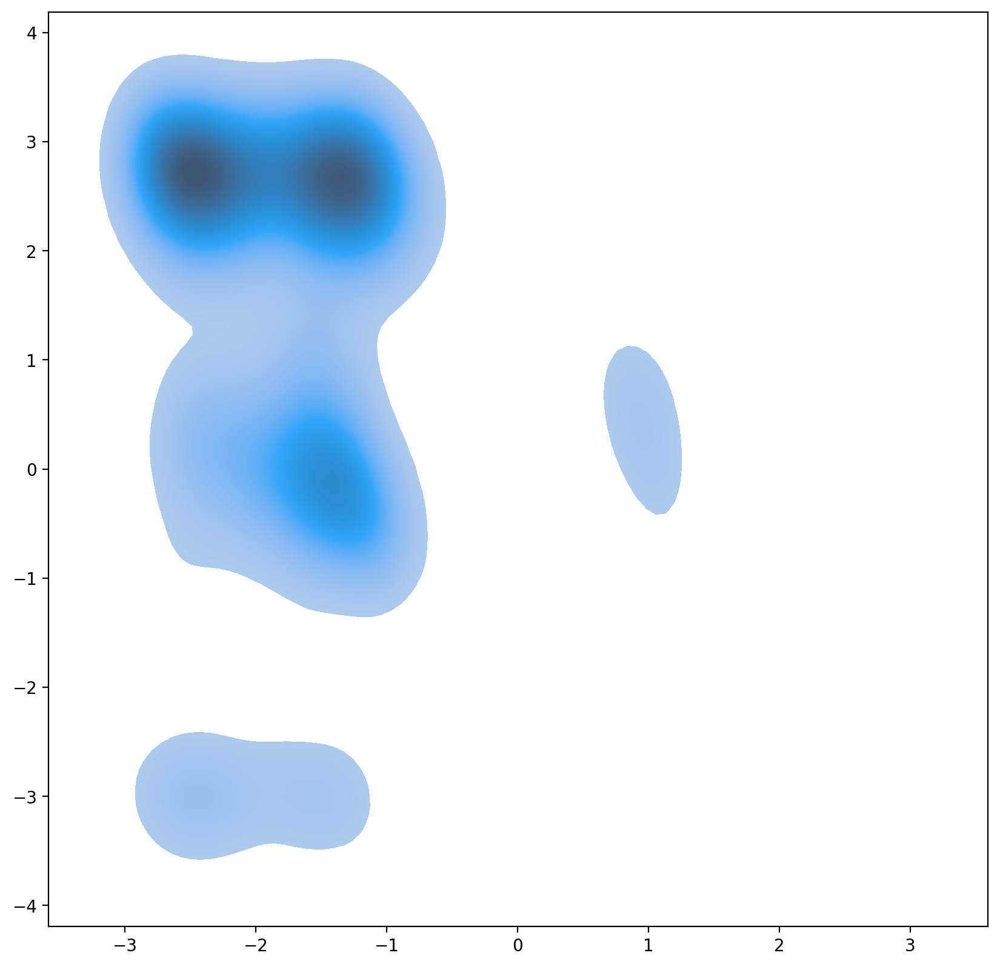

In [5]:
plt.figure(0, figsize=(10, 10), dpi=200)
sns.kdeplot(x=phi[::10, 0], y=psi[::10, 0], levels=100, gridsize=100, fill=True)

In [6]:
np.amin(torsions_rdkit), np.amin(torsions)

(2.3841858e-06, 1.5974045e-05)

In [10]:
np.std(energies), np.std(energies_rdkit)

(14.655765199128398, 84.88587509624068)

In [25]:
ebc = EBC(temperature=100, n_clusters=5, proto_radius=0.1, knn=20, boxsize=2 * np.pi, use_sparse=True) #proto_radius=6, n_clusters=9, #
ebc.fit(torsions_rdkit, energies_rdkit)

Using 858 proto clusters.
Using the eigenvector corresponding to an eigenvalue of 0.9999999999999996.


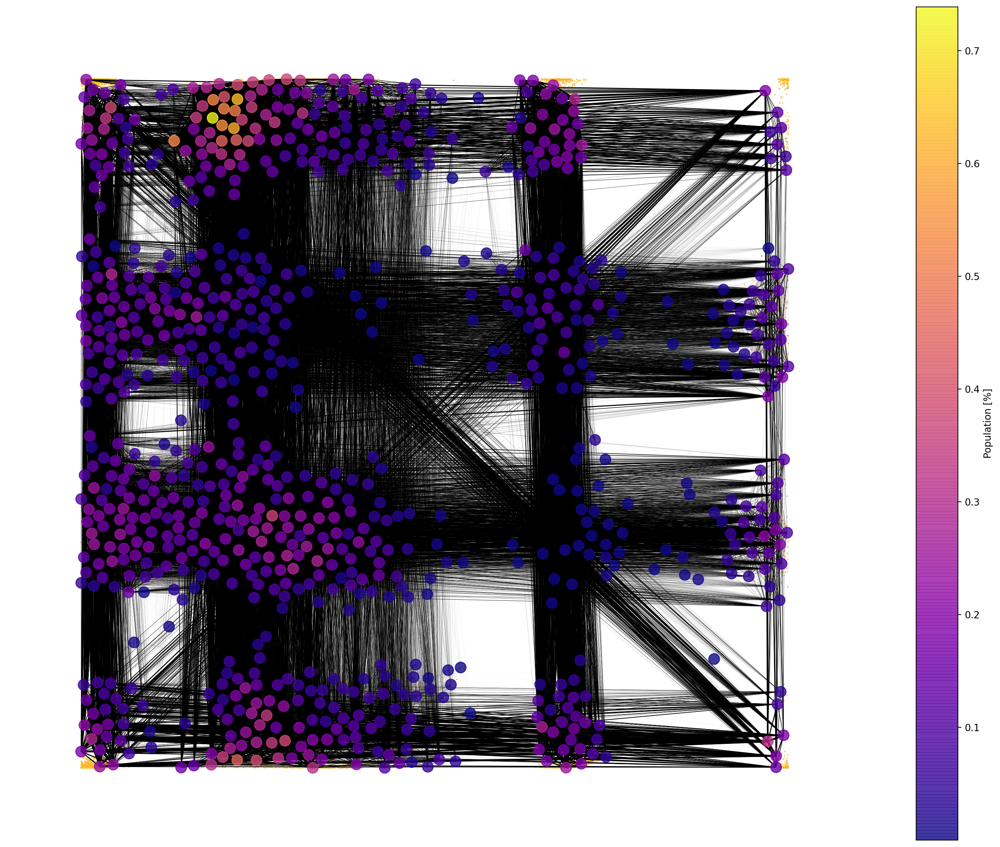

In [26]:
ebc.plot_graph()

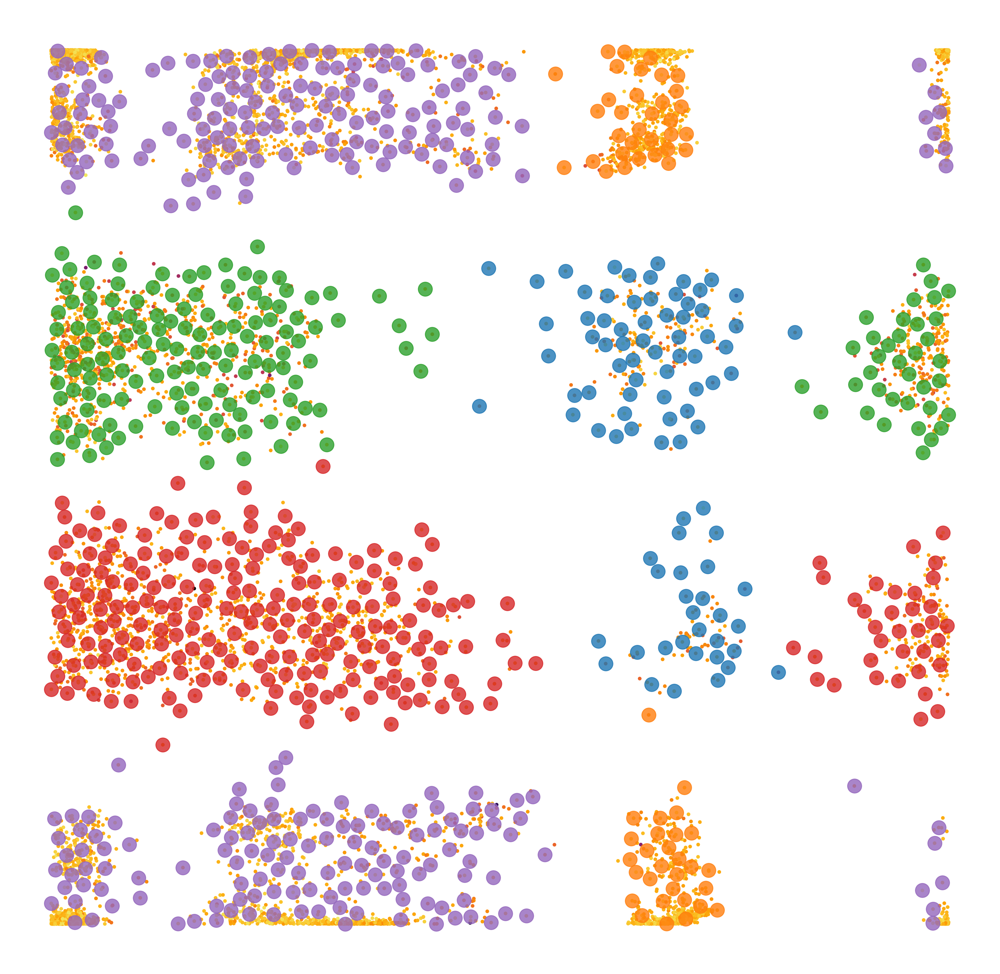

In [27]:
ebc.show()

In [28]:
ebc = EBC(temperature=100, n_clusters=5, knn=20, proto_radius=0.1, boxsize=2 * np.pi, use_sparse=True) #proto_radius=6, n_clusters=9, #
ebc.fit(torsions, energies)

Using 1064 proto clusters.
Using the eigenvector corresponding to an eigenvalue of 1.0000000000000042.


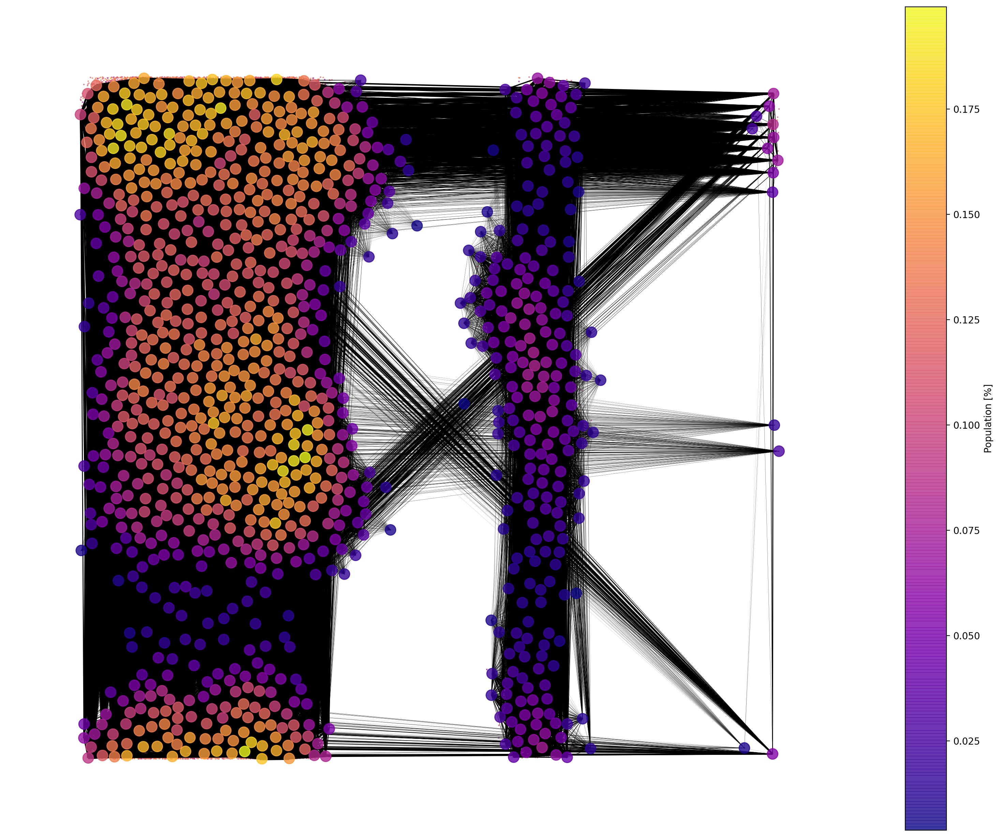

In [29]:
ebc.plot_graph()

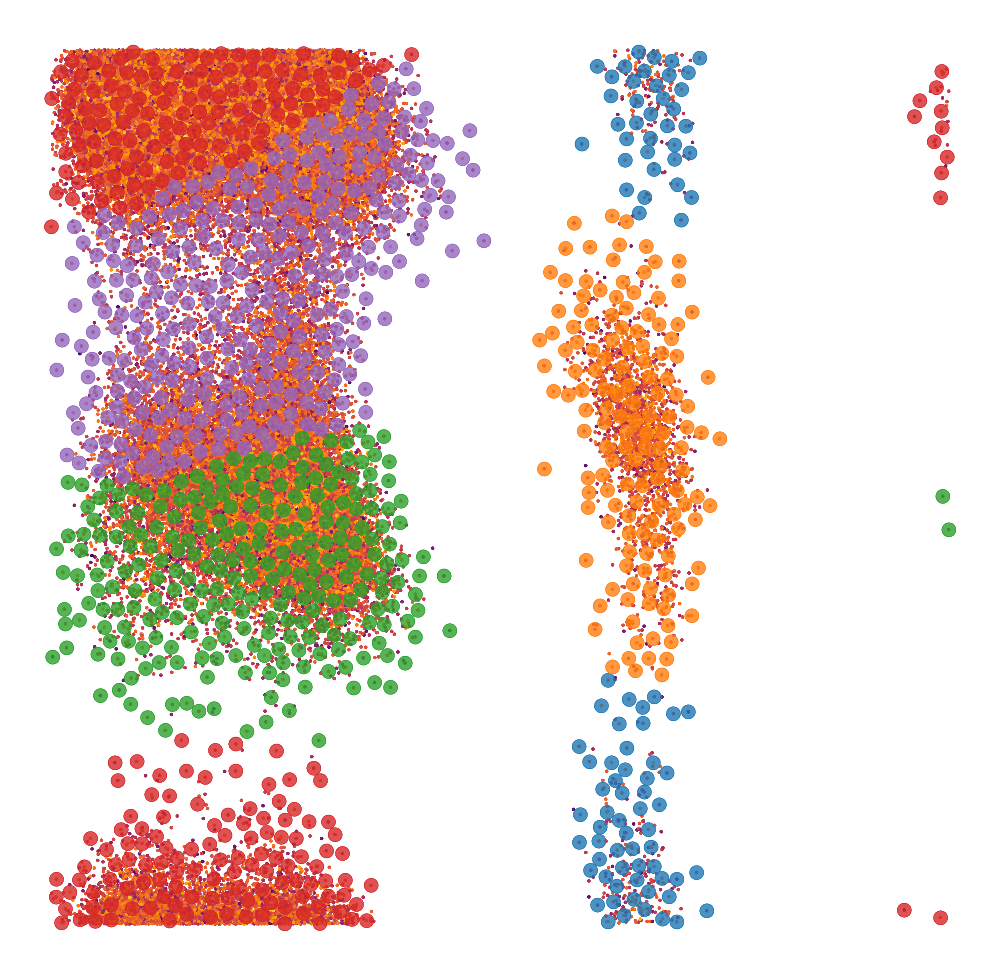

In [31]:
ebc.show()

In [15]:
w_s, v_s = snp.linalg.eigs(ebc._diffusion_matrix_sp, k=ebc._n_clusters, which='LM')
argsort = np.argsort(-w_s)
w_s, v_s = w_s[argsort].real, v_s[:, argsort].real

In [24]:
w, v = np.linalg.eig(ebc._diffusion_matrix)
argsort = np.argsort(-w)
w, v = w[argsort].real, v[:, argsort].real

In [25]:
w_T, v_T = np.linalg.eig(ebc._diffusion_matrix.T)
argsort = np.argsort(-w_T)
w_T, v_T = w_T[argsort].real, v_T[:, argsort].real

In [12]:
pi = snp.linalg.eigs(ebc._diffusion_matrix_sp.T, k=1, which='LM')[1].real
pi / np.sum(pi)

array([[1.86622956e-03],
       [1.78356435e-03],
       [1.68109520e-03],
       [1.71603572e-03],
       [1.59698460e-03],
       [1.89861558e-03],
       [1.87964875e-03],
       [1.93890286e-03],
       [1.78769803e-03],
       [1.74086581e-03],
       [2.17916909e-03],
       [1.86126429e-03],
       [2.53720831e-03],
       [2.26000647e-03],
       [1.87450761e-03],
       [2.42493486e-03],
       [1.92739611e-03],
       [2.23635023e-03],
       [1.79373638e-03],
       [1.99563967e-03],
       [1.78793694e-03],
       [1.97704968e-03],
       [1.81080568e-03],
       [2.06773377e-03],
       [1.90747837e-03],
       [1.84567395e-03],
       [1.83248723e-03],
       [1.77315172e-03],
       [1.88721393e-03],
       [1.81032753e-03],
       [2.04718620e-03],
       [2.53155196e-03],
       [1.87859303e-03],
       [1.75055091e-03],
       [2.02699601e-03],
       [1.94788486e-03],
       [1.98910520e-03],
       [1.84947467e-03],
       [1.94307569e-03],
       [1.72447116e-03],


In [14]:
ebc._extract_labels(v[:, :ebc._n_clusters]) , ebc._extract_labels(v_T[:ebc._n_clusters].T) 

(array([4, 4, 4, 2, 2, 2, 2, 1, 4, 4, 4, 2, 5, 1, 2, 5, 2, 1, 4, 4, 1, 2,
        4, 1, 2, 4, 2, 4, 4, 4, 4, 5, 1, 2, 1, 4, 2, 2, 4, 2, 4, 2, 4, 4,
        2, 2, 2, 2, 4, 4, 2, 4, 4, 1, 1, 4, 2, 1, 4, 4, 4, 5, 1, 2, 5, 1,
        2, 4, 2, 2, 2, 4, 4, 1, 4, 4, 2, 2, 4, 1, 4, 3, 2, 5, 2, 1, 1, 4,
        4, 5, 2, 2, 2, 5, 4, 4, 4, 5, 2, 5, 1, 4, 5, 1, 1, 2, 3, 2, 3, 2,
        2, 4, 5, 1, 5, 1, 5, 4, 1, 5, 2, 1, 2, 4, 4, 4, 5, 1, 1, 1, 2, 5,
        5, 5, 5, 4, 1, 2, 2, 4, 4, 1, 1, 4, 4, 4, 5, 5, 4, 4, 5, 2, 5, 1,
        5, 2, 5, 2, 5, 2, 2, 5, 4, 1, 0, 4, 4, 4, 1, 5, 5, 2, 4, 5, 3, 5,
        4, 5, 2, 4, 5, 2, 2, 2, 2, 5, 4, 3, 2, 4, 5, 1, 2, 5, 2, 5, 4, 4,
        1, 4, 3, 5, 2, 1, 2, 5, 1, 1, 5, 5, 4, 4, 1, 3, 2, 2, 4, 5, 5, 5,
        2, 5, 1, 1, 2, 1, 5, 5, 2, 5, 5, 2, 5, 4, 5, 5, 3, 5, 4, 4, 5, 1,
        3, 3, 2, 3, 3, 2, 5, 5, 5, 5, 2, 5, 2, 5, 2, 5, 5, 4, 5, 5, 5, 1,
        5, 5, 2, 5, 3, 2, 2, 5, 4, 2, 2, 1, 1, 2, 2, 4, 2, 4, 4, 3, 5, 5,
        3, 1, 3, 5, 1, 4, 4, 5, 0, 1, 